In [217]:
import folium
from folium.plugins import MarkerCluster
import os 
import pandas as pd
import glob
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np
import scipy.stats as st
import matplotlib.gridspec as gridspec


In [218]:
## All data
file_path = r'C:\Users\dbensaso\Documents\NREL 2020 Internship\2020_Farm_Results' 
folder_name= 'tabular_data_pickle' # a folder by this name should be created prior in path above 
final_path= os.path.join(file_path, folder_name)

# Combien all pickle files in the path 
dx = glob.glob('{}\*'.format(final_path))
data=pd.DataFrame([])
for i in dx: 
    dw1= pd.read_pickle(i)
    data = data.append(dw1, ignore_index=True)

In [219]:
### Additions to make
#1) Can change marker colors to reflect qhat regiion they are in OR find a way to shade the regions 
#2) Make teh size of teh marker reflect the number of turbines in the farm 

In [220]:
### For this need column with farm name, column saying # turbines, column for which region it is in, and lat long 
## make on excel for this purpose

In [221]:
excel_list = pd.read_excel(r'C:\Users\dbensaso\floris\examples\optimization\scipy\2020 Filter in region.xlsx',\
                           sheet_name='Farms_Second_Coord')
excel_list_1 = pd.read_excel(r'C:\Users\dbensaso\floris\examples\optimization\scipy\2020 Filter in region.xlsx',\
                           sheet_name='By region sub', keep_default_na=False)

In [222]:
subset_list= excel_list['Subset']

west = excel_list_1['West']
interior = excel_list_1['Interior']
great_lakes = excel_list_1['Great_Lakes']
south_east = excel_list_1['South_East']
north_east = excel_list_1['North_East']

west_data = pd.DataFrame([])
interior_data = pd.DataFrame([])
great_lakes_data = pd.DataFrame([])
south_east_data = pd.DataFrame([])
north_east_data = pd.DataFrame([])

for i in range(len(subset_list)):
    
        kf = (excel_list.loc[excel_list['Subset'] == subset_list[i]])
        if subset_list[i] in west.values:
            west_data = west_data.append(kf, ignore_index=True)
            west_data['Region'] = 'West'
        if subset_list[i] in interior.values:
            interior_data = interior_data.append(kf, ignore_index=True)
            interior_data['Region'] = 'Interior'
        if subset_list[i] in great_lakes.values:
            great_lakes_data = great_lakes_data.append(kf, ignore_index=True)
            great_lakes_data['Region'] = 'Great Lakes'
        if subset_list[i] in south_east.values:
            south_east_data = south_east_data.append(kf, ignore_index=True)
            south_east_data['Region'] = 'South East'
        if subset_list[i] in north_east.values:
            north_east_data = north_east_data.append(kf, ignore_index=True)
            north_east_data['Region'] = 'North East'

c:\users\dbensaso\appdata\local\continuum\anaconda3\lib\site-packages\pandas\core\frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


In [223]:
north_east_data

,Region,Subset,xcoord,ycoord
0,North East,Arkwright Summit,42.407748,-79.231833
1,North East,Bear Creek,41.237073,-75.751918
2,North East,Copenhagen,43.890878,-75.639337
3,North East,Forward,40.098299,-78.861701
4,North East,Howard,42.312712,-77.536952
5,North East,Mars Hill,46.544216,-67.811061
6,North East,Marsh Hill,42.177323,-77.504577
7,North East,Mehoopany,41.467644,-76.077193
8,North East,Noble Bliss,42.545117,-78.258640
9,North East,Bingham Wind,45.126968,-69.699042


c:\users\dbensaso\appdata\local\continuum\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


(0, 150)

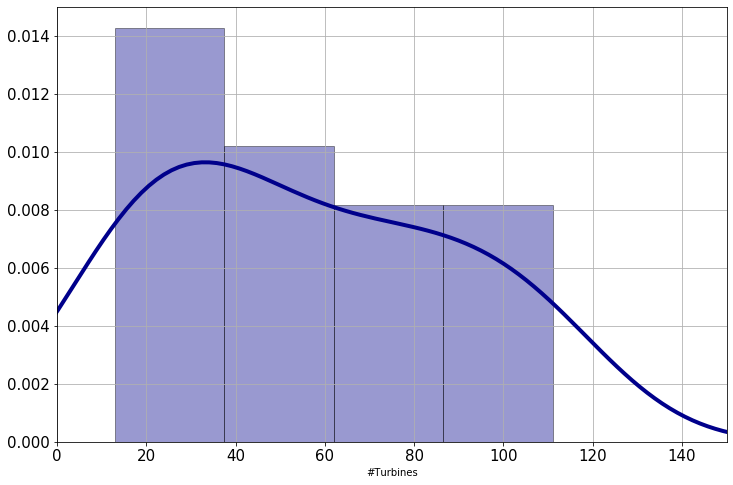

In [224]:
## Make plots showing dist of #turbine, power capacity, and farm density 
dist_excel = pd.read_excel(r'C:\Users\dbensaso\floris\examples\optimization\scipy\2020 Filter in region.xlsx',\
                           sheet_name='Farms_turb')

dist_west = dist_excel[dist_excel['Region'] == 'West']
dist_interior = dist_excel[dist_excel['Region'] == 'Interior']
dist_south_east =dist_excel[dist_excel['Region'] == 'South East']
dist_north_east = dist_excel[dist_excel['Region'] == 'North East']
dist_great_lakes = dist_excel[dist_excel['Region'] == 'Great Lakes']

fig, ax = plt.subplots(1,1,figsize=(12,8))
sns.distplot(dist_interior['#Turbines'], hist=True, kde=True,
             bins=int(200/50), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

mean=round(dist_interior['#Turbines'].mean(),2)
median=round(dist_interior['#Turbines'].median(),2)
stan=round(dist_interior['#Turbines'].std(),2)
ax.tick_params(axis='both', labelsize=15)
plt.xlim(0, 150)
#ax.set_xlabel('Number of Turbines', fontsize=15)
#label1 = 'Mean: ' + str(mean) +'%'
#ax.annotate(label1,xy=(150,0.07), ha='right',va='top',color='.08',fontsize=16)
#label2 = 'Median: ' + str(median)+'%'
#ax.annotate(label2,xy=(150,0.06), ha='right',va='top',color='.08',fontsize=16)
#label3 = 'Std.dev: ' + str(stan)+'%'
#ax.annotate(label3,xy=(150,0.05), ha='right',va='top',color='.08',fontsize=16)

In [230]:
dist_excel = pd.read_excel(r'C:\Users\dbensaso\floris\examples\optimization\scipy\2020 Filter in region.xlsx',\
                           sheet_name='Farms_turb')
farms = dist_excel['Farm_Name']
#farms.to_pickle(r'C:\Users\dbensaso\floris\examples\optimization\scipy\Sub_farm_names')
dist_west = dist_excel[dist_excel['Region'] == 'West']
dist_interior = dist_excel[dist_excel['Region'] == 'Interior']
dist_south_east =dist_excel[dist_excel['Region'] == 'South East']
dist_north_east = dist_excel[dist_excel['Region'] == 'North East']
dist_great_lakes = dist_excel[dist_excel['Region'] == 'Great Lakes']
dist_interior

,Farm_Name,#Turbines,Rated_power,Capacity,Region,Area_mine,Density_mine,Area_dylan,Density_dylan,diff in A
4,Armadillo Flats,109,2.300,218.120,Interior,140.550925,1.551893,150.836912,1.446065,NaN
7,"Beethoven Wind, LLC",43,1.850,79.550,Interior,24.847542,3.201524,36.440030,2.183039,37.829816
9,Blackwell,26,2.300,59.800,Interior,17.717086,3.375273,26.898649,2.223160,41.158409
10,Blue Canyon VI,55,1.800,99.000,Interior,16.992145,5.826222,27.155421,3.645681,46.042295
11,Blue Cloud I,43,3.450,148.350,Interior,43.239710,3.430874,52.426417,2.829680,NaN
14,Border Winds Project,75,2.000,150.000,Interior,92.558920,1.620589,113.375031,1.323043,20.216298
15,Breckinridge,57,1.700,96.900,Interior,29.817782,3.249739,44.757450,2.165003,40.066033
18,Busch Ranch,16,1.800,28.800,Interior,1.942956,14.822773,8.527118,3.377460,125.771059
20,Cactus Flats,42,3.450,144.900,Interior,49.060025,2.953525,57.426347,2.523232,NaN
22,Cedar Bluff,111,1.790,198.690,Interior,80.829146,2.458148,100.304956,1.980859,21.504300


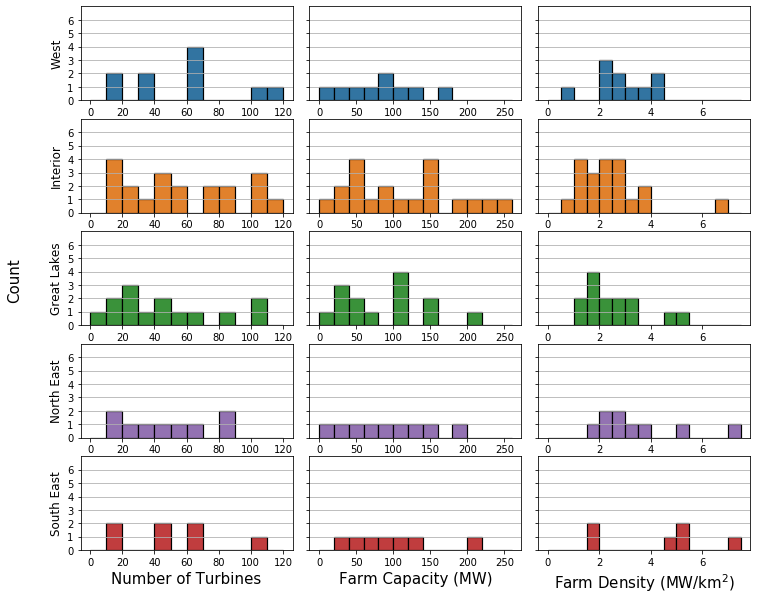

In [231]:
fig,ax =  plt.subplots(5,3,figsize=(12, 10), sharey=True)

fig.subplots_adjust(wspace=0.08)

bins_list = np.arange(0,130,10)

ax[0][0].hist(dist_west['#Turbines'], bins =bins_list , edgecolor='black', color = '#3274A1', linewidth=1.2)
ax[1][0].hist(dist_interior['#Turbines'], bins =bins_list , edgecolor='black',color = '#E1812C', linewidth=1.2)
ax[2][0].hist(dist_great_lakes['#Turbines'], bins =bins_list , edgecolor='black',color = '#3A923A', linewidth=1.2)
ax[3][0].hist(dist_north_east['#Turbines'], bins =bins_list , edgecolor='black', color = '#9372B2',linewidth=1.2)
ax[4][0].hist(dist_south_east['#Turbines'], bins =bins_list , edgecolor='black',color = '#C03D3E', linewidth=1.2)

bins_list_1 = np.arange(0,280,20)
ax[0][1].hist(dist_west['Capacity'],bins =bins_list_1, edgecolor='black',color = '#3274A1', linewidth=1.2)
ax[1][1].hist(dist_interior['Capacity'], bins =bins_list_1 , edgecolor='black',color = '#E1812C', linewidth=1.2)
ax[2][1].hist(dist_great_lakes['Capacity'], bins =bins_list_1 , edgecolor='black',color = '#3A923A', linewidth=1.2)
ax[3][1].hist(dist_north_east['Capacity'], bins =bins_list_1 , edgecolor='black',color = '#9372B2', linewidth=1.2)
ax[4][1].hist(dist_south_east['Capacity'], bins =bins_list_1 , edgecolor='black',color = '#C03D3E', linewidth=1.2)


bins_list_2 = np.arange(0,8,0.5)
ax[0][2].hist(dist_west['Density_dylan'],bins =bins_list_2, edgecolor='black',color = '#3274A1', linewidth=1.2)
ax[1][2].hist(dist_interior['Density_dylan'],bins =bins_list_2 , edgecolor='black',color = '#E1812C', linewidth=1.2)
ax[2][2].hist(dist_great_lakes['Density_dylan'], bins =bins_list_2 , edgecolor='black',color = '#3A923A', linewidth=1.2)
ax[3][2].hist(dist_north_east['Density_dylan'],  bins =bins_list_2 , edgecolor='black',color = '#9372B2', linewidth=1.2)
ax[4][2].hist(dist_south_east['Density_dylan'],  bins =bins_list_2 , edgecolor='black',color = '#C03D3E', linewidth=1.2)
#ax[4][2].grid(axis='y')

ax[4][0].set_xlabel('Number of Turbines', fontsize = 15)
ax[4][1].set_xlabel('Farm Capacity (MW)', fontsize = 15)
ax[4][2].set_xlabel('Farm Density (MW/km$^2$)', fontsize = 15)

ax[0][0].set_ylabel('West', fontsize = 12)
ax[1][0].set_ylabel('Interior', fontsize = 12)
ax[2][0].set_ylabel('Great Lakes', fontsize = 12)
ax[3][0].set_ylabel('North East', fontsize = 12)
ax[4][0].set_ylabel('South East', fontsize = 12)


plt.setp(ax, ylim=(0,7), yticks=np.arange(0, 7, step=1) )
fig.text(0.04, 0.5, 'Count', va='center', rotation='vertical',fontsize = 15)

for i in [0,1,2,3,4]:
    for j in [0,1,2]:
        ax[i][j].grid(axis='x')

c:\users\dbensaso\appdata\local\continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:24: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
c:\users\dbensaso\appdata\local\continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:25: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
c:\users\dbensaso\appdata\local\continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:26: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
c:\users\dbensaso\appdata\local\continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:27: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
c:\users\dbensaso\appdata\local\continuum\anaconda3\lib\site-packages\ipykernel_

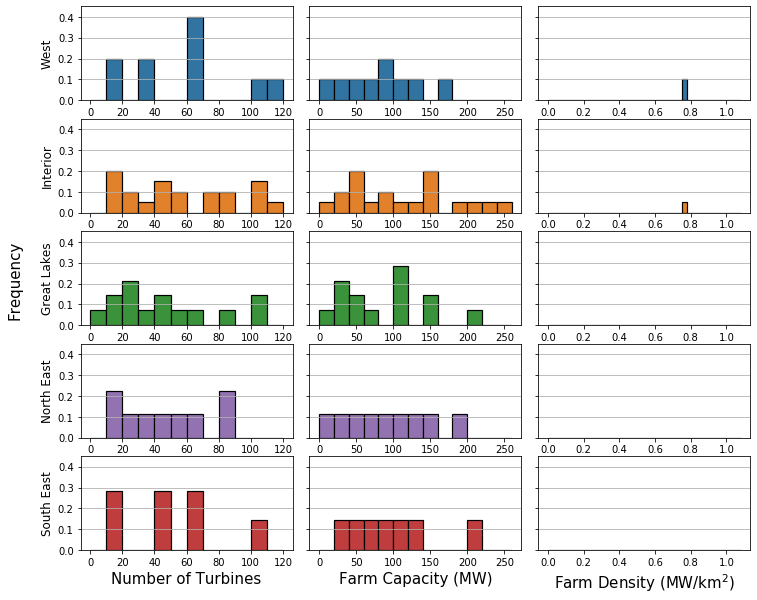

In [228]:
fig,ax =  plt.subplots(5,3,figsize=(12, 10), sharey=True)

fig.subplots_adjust(wspace=0.08)

bins_list = np.arange(0,130,10)
weights_west_turb = np.ones_like(dist_west['#Turbines'])/float(len(dist_west['#Turbines']))
weights_interior_turb = np.ones_like(dist_interior['#Turbines'])/float(len(dist_interior['#Turbines']))
weights_great_lakes_turb = np.ones_like(dist_great_lakes['#Turbines'])/float(len(dist_great_lakes['#Turbines']))
weights_north_east_turb = np.ones_like(dist_north_east['#Turbines'])/float(len(dist_north_east['#Turbines']))
weights_south_east_turb = np.ones_like(dist_south_east['#Turbines'])/float(len(dist_south_east['#Turbines']))

weights_west_cap = np.ones_like(dist_west['Capacity'])/float(len(dist_west['Capacity']))
weights_interior_cap = np.ones_like(dist_interior['Capacity'])/float(len(dist_interior['Capacity']))
weights_great_lakes_cap = np.ones_like(dist_great_lakes['Capacity'])/float(len(dist_great_lakes['Capacity']))
weights_north_east_cap = np.ones_like(dist_north_east['Capacity'])/float(len(dist_north_east['Capacity']))
weights_south_east_cap = np.ones_like(dist_south_east['Capacity'])/float(len(dist_south_east['Capacity']))

weights_west_den = np.ones_like(dist_west['Density_dylan'])/float(len(dist_west['Density_dylan']))
weights_interior_den = np.ones_like(dist_interior['Density_dylan'])/float(len(dist_interior['Density_dylan']))
weights_great_lakes_den = np.ones_like(dist_great_lakes['Density_dylan'])/float(len(dist_great_lakes['Density_dylan']))
weights_north_east_den = np.ones_like(dist_north_east['Density_dylan'])/float(len(dist_north_east['Density_dylan']))
weights_south_east_den = np.ones_like(dist_south_east['Density_dylan'])/float(len(dist_south_east['Density_dylan']))

ax[0][0].hist(dist_west['#Turbines'], normed = 0, weights= weights_west_turb, bins =bins_list , edgecolor='black', color = '#3274A1', linewidth=1.2)
ax[1][0].hist(dist_interior['#Turbines'], normed = 0, weights= weights_interior_turb, bins =bins_list , edgecolor='black',color = '#E1812C', linewidth=1.2)
ax[2][0].hist(dist_great_lakes['#Turbines'], normed = 0, weights= weights_great_lakes_turb, bins =bins_list , edgecolor='black',color = '#3A923A', linewidth=1.2)
ax[3][0].hist(dist_north_east['#Turbines'], normed = 0, weights= weights_north_east_turb, bins =bins_list , edgecolor='black', color = '#9372B2',linewidth=1.2)
ax[4][0].hist(dist_south_east['#Turbines'], normed = 0, weights= weights_south_east_turb, bins =bins_list , edgecolor='black',color = '#C03D3E', linewidth=1.2)

bins_list_1 = np.arange(0,280,20)
ax[0][1].hist(dist_west['Capacity'], normed = 0, weights= weights_west_cap ,bins =bins_list_1, edgecolor='black',color = '#3274A1', linewidth=1.2)
ax[1][1].hist(dist_interior['Capacity'], normed = 0, weights= weights_interior_cap, bins =bins_list_1 , edgecolor='black',color = '#E1812C', linewidth=1.2)
ax[2][1].hist(dist_great_lakes['Capacity'],normed = 0, weights= weights_great_lakes_cap, bins =bins_list_1 , edgecolor='black',color = '#3A923A', linewidth=1.2)
ax[3][1].hist(dist_north_east['Capacity'], normed = 0, weights= weights_north_east_cap, bins =bins_list_1 , edgecolor='black',color = '#9372B2', linewidth=1.2)
ax[4][1].hist(dist_south_east['Capacity'], normed = 0, weights= weights_south_east_cap, bins =bins_list_1 , edgecolor='black',color = '#C03D3E', linewidth=1.2)


bins_list_2 = np.arange(0,1.1,0.03)
ax[0][2].hist(dist_west['Density_dylan'], normed = 0, weights= weights_west_den ,bins =bins_list_2, edgecolor='black',color = '#3274A1', linewidth=1.2)
ax[1][2].hist(dist_interior['Density_dylan'], normed = 0, weights= weights_interior_den, bins =bins_list_2 , edgecolor='black',color = '#E1812C', linewidth=1.2)
ax[2][2].hist(dist_great_lakes['Density_dylan'],normed = 0, weights= weights_great_lakes_den, bins =bins_list_2 , edgecolor='black',color = '#3A923A', linewidth=1.2)
ax[3][2].hist(dist_north_east['Density_dylan'], normed = 0, weights= weights_north_east_den, bins =bins_list_2 , edgecolor='black',color = '#9372B2', linewidth=1.2)
ax[4][2].hist(dist_south_east['Density_dylan'], normed = 0, weights= weights_south_east_den, bins =bins_list_2 , edgecolor='black',color = '#C03D3E', linewidth=1.2)
#ax[4][2].grid(axis='y')

ax[4][0].set_xlabel('Number of Turbines', fontsize = 15)
ax[4][1].set_xlabel('Farm Capacity (MW)', fontsize = 15)
ax[4][2].set_xlabel('Farm Density (MW/km$^2$)', fontsize = 15)

ax[0][0].set_ylabel('West', fontsize = 12)
ax[1][0].set_ylabel('Interior', fontsize = 12)
ax[2][0].set_ylabel('Great Lakes', fontsize = 12)
ax[3][0].set_ylabel('North East', fontsize = 12)
ax[4][0].set_ylabel('South East', fontsize = 12)


plt.setp(ax, ylim=(0,0.45), yticks=np.arange(0, 0.5, step=0.1) )
fig.text(0.04, 0.5, 'Frequency', va='center', rotation='vertical',fontsize = 15)

for i in [0,1,2,3,4]:
    for j in [0,1,2]:
        ax[i][j].grid(axis='x')
        



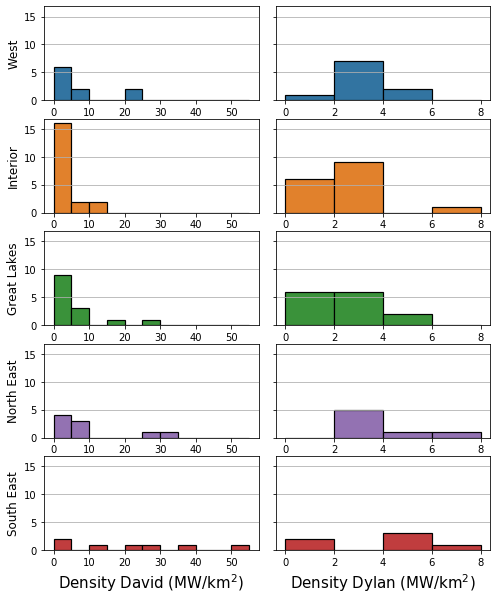

In [194]:
## Comparison of dyland densityh and mu method 
dist_excel = pd.read_excel(r'C:\Users\dbensaso\floris\examples\optimization\scipy\2020 Filter in region.xlsx',\
                           sheet_name='Farms_turb')
farms = dist_excel['Farm_Name']
#farms.to_pickle(r'C:\Users\dbensaso\floris\examples\optimization\scipy\Sub_farm_names')
dist_west = dist_excel[dist_excel['Region'] == 'West']
dist_interior = dist_excel[dist_excel['Region'] == 'Interior']
dist_south_east =dist_excel[dist_excel['Region'] == 'South East']
dist_north_east = dist_excel[dist_excel['Region'] == 'North East']
dist_great_lakes = dist_excel[dist_excel['Region'] == 'Great Lakes']

fig,ax =  plt.subplots(5,2,figsize=(8, 10), sharey=True)

fig.subplots_adjust(wspace=0.08)

bins_list = np.arange(0,130,10)

bins_list_2 = np.arange(0,60,5)
ax[0][0].hist(dist_west['Density_mine'],bins =bins_list_2, edgecolor='black',color = '#3274A1', linewidth=1.2)
ax[1][0].hist(dist_interior['Density_mine'],bins =bins_list_2 , edgecolor='black',color = '#E1812C', linewidth=1.2)
ax[2][0].hist(dist_great_lakes['Density_mine'], bins =bins_list_2 , edgecolor='black',color = '#3A923A', linewidth=1.2)
ax[3][0].hist(dist_north_east['Density_mine'],  bins =bins_list_2 , edgecolor='black',color = '#9372B2', linewidth=1.2)
ax[4][0].hist(dist_south_east['Density_mine'],  bins =bins_list_2 , edgecolor='black',color = '#C03D3E', linewidth=1.2)

bins_list_3 = np.arange(0,10,2)
ax[0][1].hist(dist_west['Density_dylan'],bins =bins_list_3, edgecolor='black',color = '#3274A1', linewidth=1.2)
ax[1][1].hist(dist_interior['Density_dylan'],bins =bins_list_3 , edgecolor='black',color = '#E1812C', linewidth=1.2)
ax[2][1].hist(dist_great_lakes['Density_dylan'], bins =bins_list_3 , edgecolor='black',color = '#3A923A', linewidth=1.2)
ax[3][1].hist(dist_north_east['Density_dylan'],  bins =bins_list_3 , edgecolor='black',color = '#9372B2', linewidth=1.2)
ax[4][1].hist(dist_south_east['Density_dylan'],  bins =bins_list_3 , edgecolor='black',color = '#C03D3E', linewidth=1.2)


ax[4][0].set_xlabel('Density David (MW/km$^2$)', fontsize = 15)
ax[4][1].set_xlabel('Density Dylan (MW/km$^2$)', fontsize = 15)


ax[0][0].set_ylabel('West', fontsize = 12)
ax[1][0].set_ylabel('Interior', fontsize = 12)
ax[2][0].set_ylabel('Great Lakes', fontsize = 12)
ax[3][0].set_ylabel('North East', fontsize = 12)
ax[4][0].set_ylabel('South East', fontsize = 12)


for i in [0,1,2,3,4]:
    for j in [0,1]:
        ax[i][j].grid(axis='x')

In [187]:
dist_excel

,Farm_Name,#Turbines,Rated_power,Capacity,Region,Area_mine,Density_mine,Area_dylan,Density_dylan
0,Burley Butte,13,1.500,19.500,West,0.793824,24.564653,4.395979,4.435872
1,Red Horse 2,15,2.000,30.000,West,1.344077,22.320144,6.887655,4.355619
2,Horse Butte,32,1.800,57.600,West,15.275528,3.770737,25.735326,2.238169
3,Dry Lake,30,2.100,63.000,West,16.065775,3.921379,25.304191,2.489706
4,Perrin Ranch,62,1.600,99.200,West,107.688440,0.921176,128.929598,0.769412
5,Milford Phase II,68,1.500,102.000,West,18.625339,5.476410,28.737750,3.549338
6,Vantage Point,60,1.500,90.000,West,15.073524,5.970734,27.685294,3.250823
7,Cold Springs,60,2.100,126.000,West,38.650367,3.259995,51.415256,2.450635
8,North Sky River,100,1.620,162.000,West,48.845264,3.316596,63.239892,2.561674
9,Tucannon River,116,2.300,266.800,West,76.715261,3.477796,94.945108,2.810045


In [172]:
data_lists = [west_data, interior_data, great_lakes_data, south_east_data, north_east_data]
overall_data = pd.DataFrame([])
for i in data_lists:
    overall_data = overall_data.append(i, ignore_index=True)
overall_data

,Region,Subset,xcoord,ycoord
0,West,Burley Butte,42.489186,-113.922835
1,West,Cold Springs,43.033497,-115.441547
2,West,Dry Lake,34.654902,-110.284576
3,West,Horse Butte,43.404835,-111.739454
4,West,Milford Phase II,38.585220,-112.930835
5,West,North Sky River,35.335575,-118.186344
6,West,Perrin Ranch,35.429782,-112.289750
7,West,Red Horse 2,32.288584,-110.088399
8,West,Tucannon River,46.433366,-118.046519
9,West,Vantage Point,46.953916,-120.161813


In [215]:
locations = overall_data[['xcoord', 'ycoord']]
locationlist = locations.values.tolist()

def regioncolors(dataframe):
    if dataframe['Region'] == 'West':
        return 'green'
    elif dataframe['Region'] == 'Interior':
        return 'blue'
    elif dataframe['Region'] == 'South East':
        return 'red'
    elif dataframe['Region'] == 'North East':
        return 'purple'
    else:
        return 'darkblue'

overall_data["Color"] = overall_data.apply(regioncolors, axis=1)

## Number of pixels for a 5 turb farm
initial = 25

## Pixels per turbine
scale = 8 / initial

pixels= []
#for i in range(len(overall_data['#Turbine'])):
#    numt = overall_data['#Turbine'][i]
#    size = numt * scale
#    pixels.append(size)

#overall_data['Size']= pixels



map = folium.Map(location=[40, -102.05], zoom_start=4.48, control_scale = True)
for point in range(0, len(locationlist)):
    region = str(overall_data['Region'][point])
    #icon = folium.Icon(color=overall_data["Color"][point],icon="circle", prefix='fa')
    icon_path = r'C:\Users\dbensaso\floris\examples\optimization\scipy\2020_Farms\{}.png'.format(region)
    #icon_size = (overall_data['Size'][point],overall_data['Size'][point])
    icon = folium.features.CustomIcon(icon_image=icon_path ,icon_size=6)
    folium.Marker(locationlist[point], popup=overall_data['Subset'][point],\
                 icon=icon).add_to(map)
star_path = r'C:\Users\dbensaso\floris\examples\optimization\scipy\star.png'
icon_star = folium.features.CustomIcon(icon_image=star_path ,icon_size=14)
folium.Marker([40.995293, -84.565796], popup='Parametric Study Location',\
                 icon=icon_star).add_to(map)
map

In [92]:
### correct Fowrad and howward from great lakes to north east 

## Icon size doesnt work, could mannualu save images of different sized ones and create another look up function to decide 
## on which to use

In [118]:
# Finding the runtime for subset
time= []
for i in range(len(overall_data['#Turbine'])):
    numt = overall_data['#Turbine'][i]
    timem = 0.0027*(numt**3) - 0.054*(numt**2) + 2.4211*(numt) - 14.004
    time.append(timem)

In [121]:
overall_data['Runtime']= time


In [123]:
(overall_data['Runtime'].sum() / 60) *10

5998.9911666666685

In [197]:
### Crazy Idea to add all of the turbines as well. 
mf =pd.read_pickle(r'C:\Users\dbensaso\floris\examples\optimization\scipy\Wind_US_Database')
test_case = pd.DataFrame([])
lat = []
lon = []
for i in overall_data['Farm Name']: 
    kf = (mf.loc[mf['p_name'] == i])
    latit =  kf['ylat'].to_list()
    longid = kf['xlong'].to_list()
    for ii in range(len(latit)):
        lat.append(latit[ii])
        lon.append(longid[ii])
    #test_case = test_case.append(pd.DataFrame({'Lat': latit, 'Lon':longid},ignore_index=True))

test_case['Lat'] = lat
test_case['Lon'] = lon

In [201]:
locations = test_case[['Lat', 'Lon']]
locationlist = locations.values.tolist()


map = folium.Map(location=[40, -102.05], zoom_start=4.47)
for point in range(0, len(locationlist)):
    region = 'South East'
    icon_path = r'C:\Users\dbensaso\floris\examples\optimization\scipy\2020_Farms\{}.png'.format(region)
    icon_size = (5,5)
    icon = folium.features.CustomIcon(icon_image=icon_path ,icon_size=icon_size)
    folium.Marker(locationlist[point],icon=icon).add_to(map)
map

In [216]:
### Make a map where we make our own gradient and color reflects size of farm
locations = overall_data[['Farm_lat', 'Farm_lon']]
locationlist = locations.values.tolist()

def regioncolors(dataframe):
    if 0< dataframe['#Turbine'] <=10:
        return '1'
    elif 10 < dataframe['#Turbine'] <=20:
        return '2'
    elif 20 < dataframe['#Turbine'] <=30:
        return '3'
    elif 30 < dataframe['#Turbine'] <=40:
        return '4'
    elif 40 < dataframe['#Turbine'] <=50:
        return '5'
    elif 50 < dataframe['#Turbine'] <=60:
        return '6'
    elif 60 < dataframe['#Turbine'] <=70:
        return '7'
    elif 70 < dataframe['#Turbine'] <=80:
        return '8'
    elif 80 < dataframe['#Turbine'] <=90:
        return '9'
    elif 90 < dataframe['#Turbine'] <=100:
        return '10'
    else:
        return '11'

overall_data["Color"] = overall_data.apply(regioncolors, axis=1)


map = folium.Map(location=[40, -102.05], zoom_start=4.47)
for point in range(0, len(locationlist)):
    color_code = str(overall_data['Color'][point])
    #icon = folium.Icon(color='purple',icon="circle", prefix='fa')
    icon_path = r'C:\Users\dbensaso\floris\examples\optimization\scipy\2020_Farms\{}.png'.format(color_code)
    #icon_size = (overall_data['Size'][point],overall_data['Size'][point])
    icon = folium.features.CustomIcon(icon_image=icon_path ,icon_size=(10,10))
    folium.Marker(locationlist[point], popup=overall_data['Farm Name'][point],\
                 icon=icon).add_to(map)
map

In [26]:
## Onshore layout for the journal 

layout = pd.read_excel(r'C:\Users\dbensaso\Documents\NREL 2020 Internship\layout_journal.xlsx',\
                           sheet_name='Sheet1')

c:\users\dbensaso\appdata\local\continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


Text(0, 0.5, 'Distance Spanwise (D)')

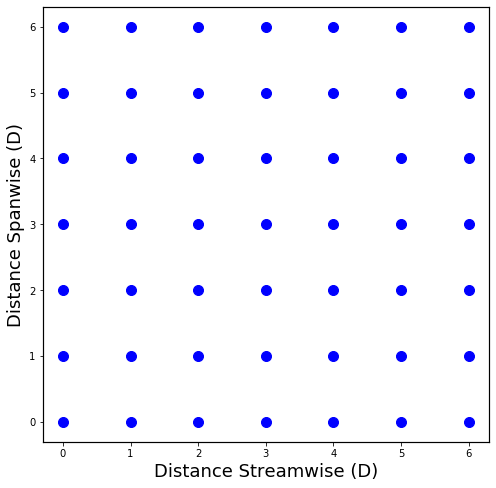

In [30]:
D = 120
x_coord = layout['x'].apply(lambda x: x/D)
y_coord = layout['y'].apply(lambda x: x/D)

fig=plt.figure(figsize=(8, 8))
plt.plot(x_coord, y_coord, 'bo', markersize = 10)

ax = fig.add_subplot(111)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(1.2)

#plt.xticks([], [])
#plt.yticks([], [])
plt.xlabel('Distance Streamwise (D)', fontsize=18)
plt.ylabel('Distance Spanwise (D)', fontsize=18)

#plt.ylim(-500,6500)
#plt.xlim(-500,6500)